In [50]:
import pandas as pd 
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import numpy as np

In [111]:
# Load in preprocessed data
pca_df = pd.read_csv('preprocessed_movie_data2.csv')

In [112]:
pca_df.head()

,Unnamed: 0,PC1,PC2
0,Kate & Leopold (2001),0.896061,2.279608
1,The Sorcerer's Apprentice (2010),0.937418,0.225093
2,Fantastic Four (2005),3.927429,0.948364
3,Fantastic Four (2015),1.845119,-0.214946
4,Frida (2002),0.516794,1.079201


In [142]:
X = pca_df.drop('Unnamed: 0', axis=1)
name = pca_df['Unnamed: 0']

In [114]:
X

,PC1,PC2
0,0.896061,2.279608
1,0.937418,0.225093
2,3.927429,0.948364
3,1.845119,-0.214946
4,0.516794,1.079201
...,...,...
9309,-0.480956,0.094310
9310,-0.480956,0.094310
9311,-0.480956,0.094310
9312,-0.480956,0.094310


In [ ]:
# Starting with 5 clusters
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)


KMeans(n_clusters=5)

In [116]:
# Joining the labels with the original Dataframe
pd.concat([pd.DataFrame(kmeans.labels_).reset_index(),X.reset_index()],axis=1).drop('index',axis=1)

,0,PC1,PC2
0,3,0.896061,2.279608
1,0,0.937418,0.225093
2,4,3.927429,0.948364
3,4,1.845119,-0.214946
4,0,0.516794,1.079201
...,...,...,...
9309,0,-0.480956,0.094310
9310,0,-0.480956,0.094310
9311,0,-0.480956,0.094310
9312,0,-0.480956,0.094310


In [117]:
metrics.silhouette_score(X,kmeans.labels_)

np.float64(0.686236412688178)

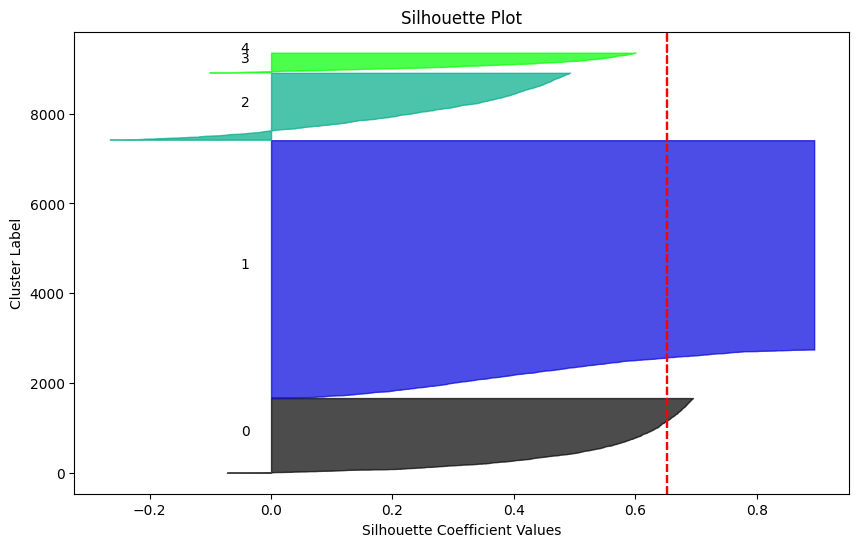

In [207]:
kmeans = KMeans(n_clusters=4, random_state=42)
# Fits the KMeans model on the transformed PCA data, predicts the cluster labels for each data point
kmeans_labels = kmeans.fit_predict(X)

fig, ax = plt.subplots(figsize=(10,6))
silhouette_avg = silhouette_score(X, kmeans_labels)
sample_silhouette_values = silhouette_samples(X, kmeans_labels)
y_lower = 10


for i in range(5):
    cluster_silhouette_values = sample_silhouette_values [kmeans_labels == i]
    cluster_silhouette_values.sort()
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size

    color = plt.cm.nipy_spectral(float(i) / 5)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    y_lower = y_upper + 10


ax.set_title("Silhouette Plot")
ax.set_xlabel("Silhouette Coefficient Values")
ax.set_ylabel("Cluster Label")
plt.show ()

In [208]:
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X, cluster_labels)
silhouette_avg = silhouette_score(X, cluster_labels)

print(f"Average Silhouette Score for n_clusters = {n_clusters}: {silhouette_avg:.3f}")

# Start plotting the silhouette
plt.figure()
y_lower = 10

for i in range(n_clusters):
    # Aggregate the silhouette scores for samples in cluster i
    ith_cluster_sil_values = sample_silhouette_values[cluster_labels == i]
    
    # Sort the silhouette values
    ith_cluster_sil_values.sort()
    
    size_cluster_i = ith_cluster_sil_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    # Fill the area for each cluster
    plt.fill_between(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_sil_values
    )
    
    # Label the silhouette plots with their cluster numbers
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
    # Move to the next segment
    y_lower = y_upper + 10  # 10 for spacing between plots

plt.title(f"Silhouette Analysis (n_clusters = {n_clusters})")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster Label")

# The vertical line for average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--")

# plt.yticks([])  # Clear the y-axis labels
plt.show()

Average Silhouette Score for n_clusters = 5: 0.690


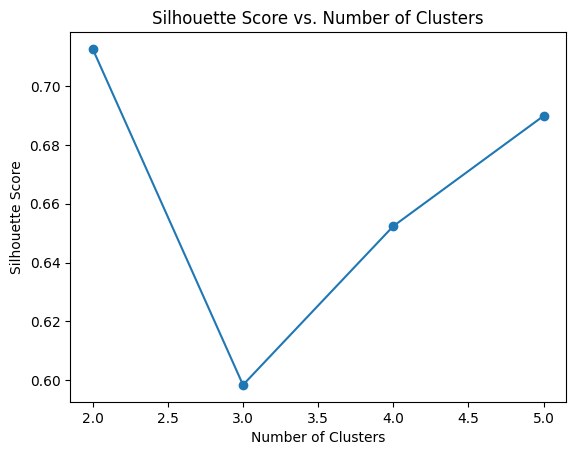

In [209]:
range_n_clusters = list(range (2,6))
silhouette_scores_list = []
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, kmeans_labels)
    silhouette_scores_list.append(silhouette_avg)

plt.figure()
plt.plot(range_n_clusters, silhouette_scores_list, marker='o')
plt.xlabel('Number of Clusters') 
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.show()

In [210]:
optimal_clusters = range_n_clusters[silhouette_scores_list.index(max(silhouette_scores_list))]
print("Optimal Number of Clusters:", optimal_clusters)

Optimal Number of Clusters: 2


In [211]:
def silhouette_analysis_kmeans(X, range_n_clusters=(2, 3, 4, 5, 6)):
    """
    For each number of clusters in range_n_clusters, this function:
    1. Performs KMeans clustering on X.
    2. Plots the silhouette scores for each cluster (left subplot).
    3. Plots the clustered data in the 2D feature space (right subplot).
    """
    
    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
        
        # Step 1: Run KMeans
        clusterer = KMeans(n_clusters=n_clusters, 
                           n_init="auto", 
                           random_state=42)
        cluster_labels = clusterer.fit_predict(X)
        
        # Step 2: Compute silhouette score
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.3f}")
        
        # Step 3: Compute silhouette scores per sample
        sample_sil_values = silhouette_samples(X, cluster_labels)
        
        # ----- Left plot: silhouette scores -----
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters + 1) * 10 is for space between silhouette plots
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        
        y_lower = 10
        for i in range(n_clusters):
            # Select and sort silhouette values for cluster i
            ith_cluster_vals = sample_sil_values[cluster_labels == i]
            ith_cluster_vals.sort()
            
            size_cluster_i = ith_cluster_vals.shape[0]
            y_upper = y_lower + size_cluster_i
            
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_vals,
                facecolor=color, 
                edgecolor=color, 
                alpha=0.7
            )
            
            # Label the silhouette plot with cluster numbers
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            
            y_lower = y_upper + 10
        
        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
        # Average silhouette score vertical line
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks(np.linspace(-0.1, 1, 12))
        
        # ----- Right plot: cluster visualization in feature space -----
        # (Here we just use the first 2 columns of X for a 2D scatter plot)
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], 
                    marker='.', s=30, lw=0, 
                    alpha=0.7, c=colors, edgecolor='k')
        
        # Mark the cluster centers
        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], 
                    marker='o', c="white", alpha=1, 
                    s=200, edgecolor='k')
        
        # Label each center with the cluster number
        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], 
                        marker=f'${i}$', alpha=1,
                        s=50, edgecolor='k')
        
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")
        
        # Main title
        plt.suptitle((f"Silhouette analysis for KMeans clustering on sample data "
                      f"with n_clusters = {n_clusters}"),
                     fontsize=14, fontweight='bold')
        
        plt.show()

In [212]:
# Count data points in each cluster
cluster_sizes = pd.Series(cluster_labels).value_counts()
cluster_sizes

1    5542
0    1648
4    1166
2     764
3     194
Name: count, dtype: int64

For n_clusters = 2, the average silhouette_score is : 0.713


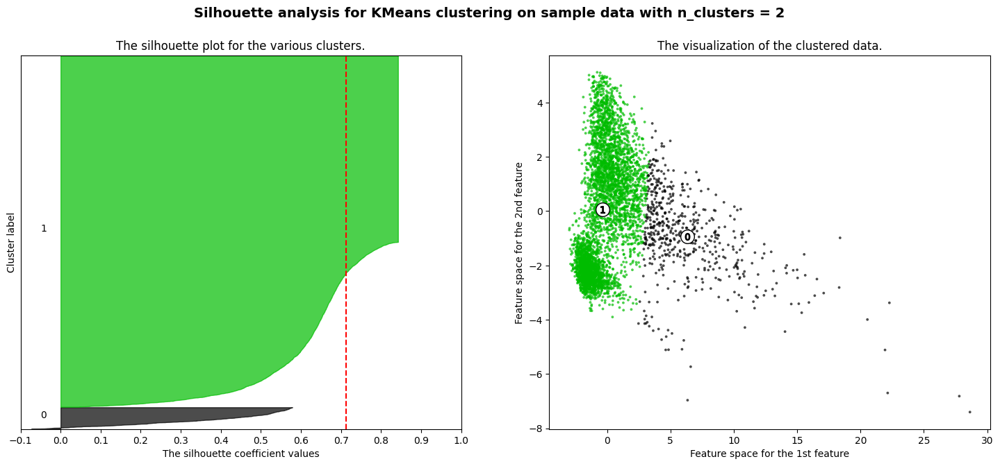

For n_clusters = 3, the average silhouette_score is : 0.598


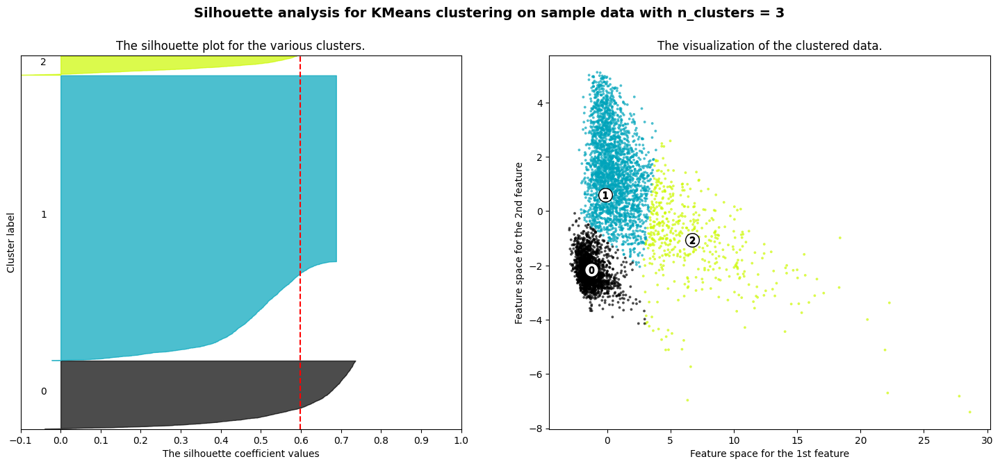

For n_clusters = 4, the average silhouette_score is : 0.652


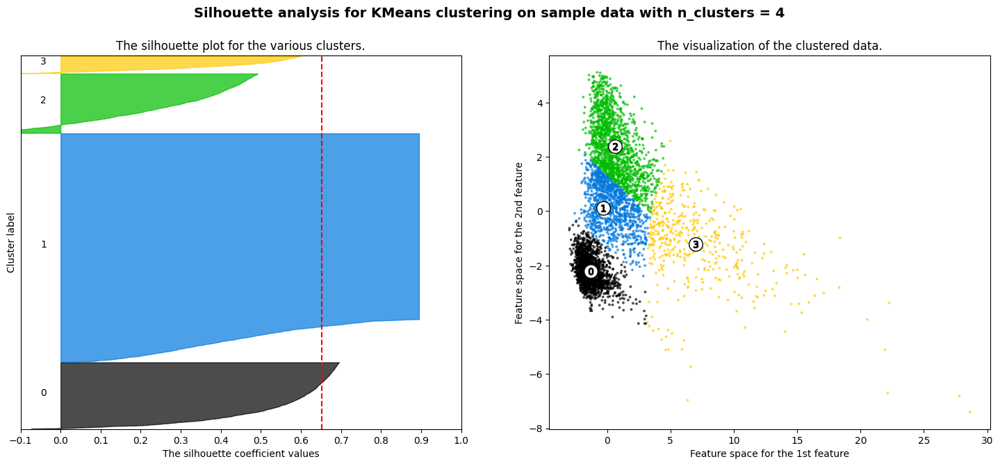

For n_clusters = 5, the average silhouette_score is : 0.690


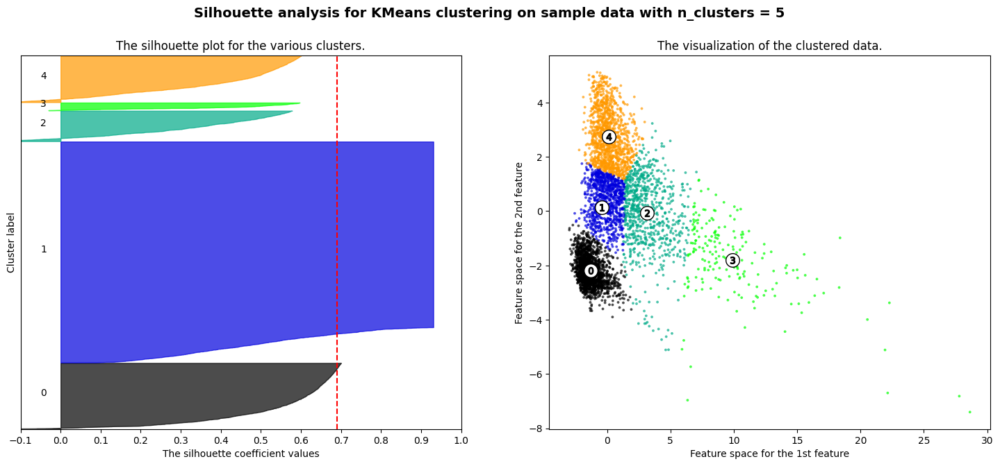

In [213]:
silhouette_analysis_kmeans(X,range_n_clusters=(2, 3, 4, 5))

For n_clusters = 2 The average silhouette_score is : 0.7126317906256298
For n_clusters = 3 The average silhouette_score is : 0.5984221086904803
For n_clusters = 4 The average silhouette_score is : 0.652395955380575
For n_clusters = 5 The average silhouette_score is : 0.6898709153158423


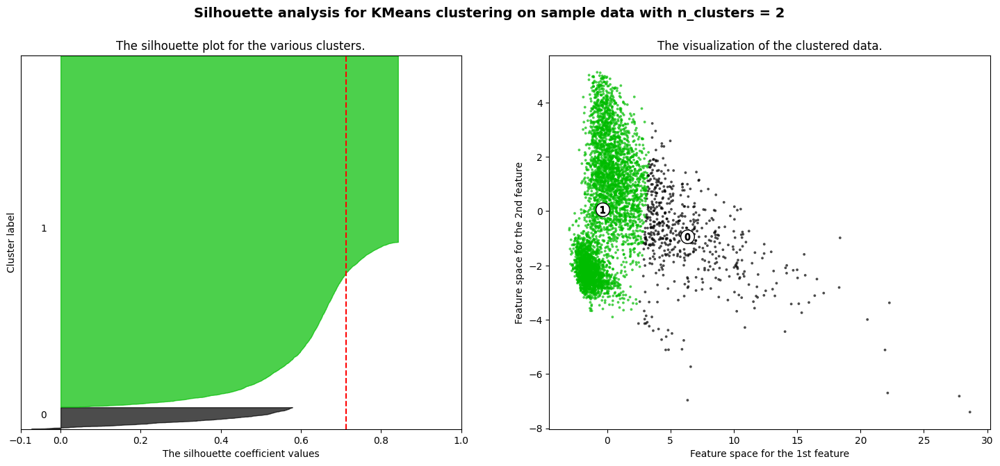

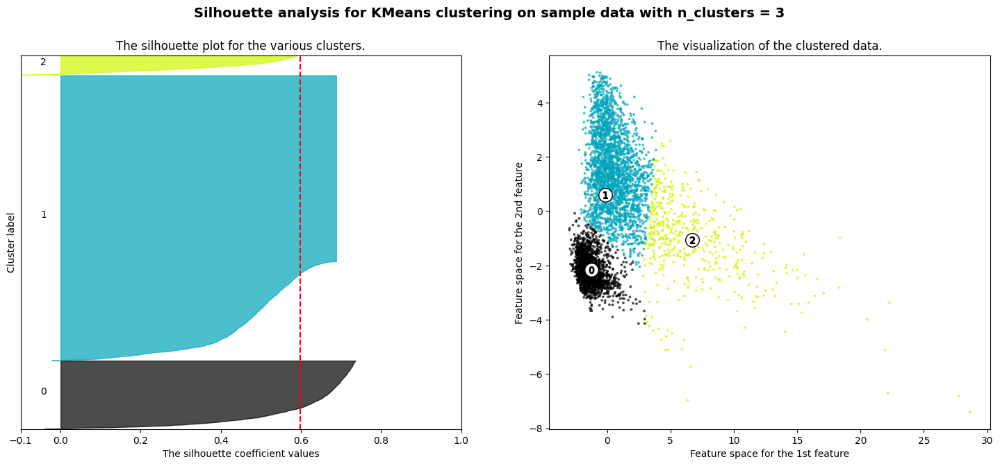

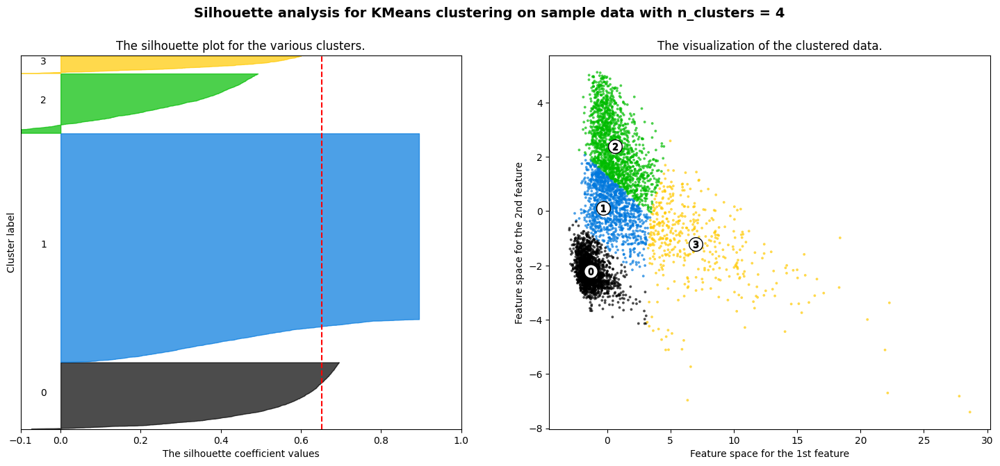

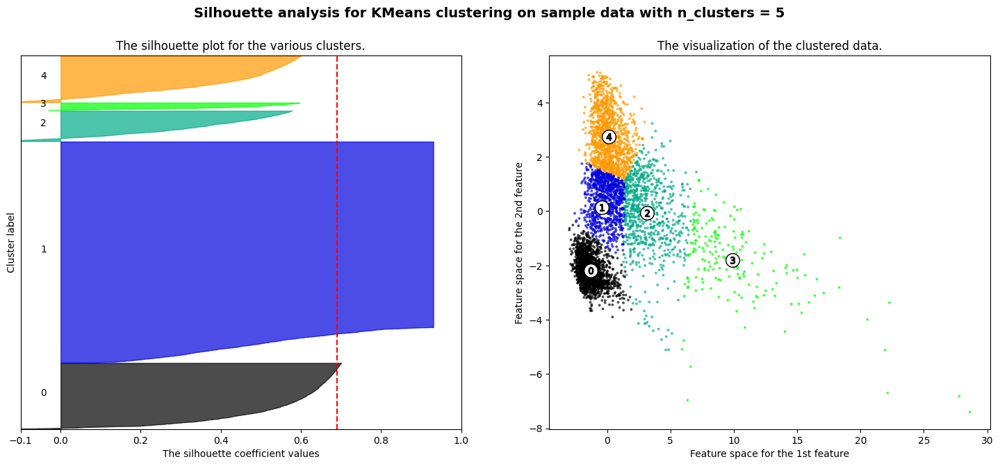

In [214]:
X 
y = kmeans.labels_

range_n_clusters = [2, 3, 4, 5]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 42 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                        0, ith_cluster_silhouette_values,
                        facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [ ]:
cluster_df = pd.concat([pd.DataFrame(kmeans.labels_).reset_index(),pca_df.reset_index()],axis=1).drop('index',axis=1)

